In [1]:
# to get started, we will import these libraries
import urllib.request, json 
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
from sodapy import Socrata
import shapely
from shapely.geometry import shape

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation
import libpysal as lps

# Graphics
import plotly.express as px

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# next we will connect to the data portal to load in vacant parcel data from LA County Assessor
client = Socrata("data.lacounty.gov", None)

# The website says this dataset has 176K rows, we are going to try to call in all of them using 180K in case more have been added. However, we are also going to limit our data to Los Angeles incorporated
results = client.get("vcaw-zeg9", limit=180000, where="taxratearea_city=='LOS ANGELES'")

# We'll need to convert to pandas DataFrame
vacdf = pd.DataFrame.from_records(results)

vacdf.sample(5)

,usecodedescchar1,roll_homeownersexemp,situsunit,recordingdate,effectiveyearbuilt,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,roll_landbaseyear,...,location_1,bathrooms,sqftmain,situsdirection,roll_realestateexemp,center_lat,situszip,yearbuilt,propertylocation,situszip5
20412,Residential,0,,19900406,0,Y,7792,0,GRAND VIEW TERRACE LOT 14,1990,...,"{'latitude': '34.09452434', 'needs_recoding': ...",0,0,,0,34.09452434,,0,NaN,NaN
10832,Commercial,0,,20020501,0,Y,3456895,0,TRACT NO 30364 LOT COM S 39¢29'03'' E 90.7 F...,1987,...,"{'latitude': '34.05984666', 'needs_recoding': ...",0,0,,0,34.05984666,,0,NaN,NaN
11666,Residential,0,,20050118,0,Y,2693,0,TRACT NO 1033 LOT 43 BLK 8,1981,...,"{'latitude': '34.09969079', 'needs_recoding': ...",0,0,,0,34.09969079,,0,NaN,NaN
26386,Residential,0,,20140902,0,Y,75000,0,TRACT # 6450 LOT 7 BLK 25,2015,...,"{'latitude': '34.12003833', 'needs_recoding': ...",0,0,,0,34.12003833,,0,NaN,NaN
23318,Residential,0,,20131217,0,Y,2039,0,RECORDER'S FILED MAP NO 604-R LOS ANGELES AND ...,2014,...,"{'latitude': '34.1097666', 'needs_recoding': F...",0,0,,0,34.10976660,,0,NaN,NaN


In [3]:
# we need to replace null objects with "n/a" in order to analyze and plot this important data on the designated use type of these parcels later
vacdf['usecodedescchar1'].fillna('N/A')

0         Industrial
1        Residential
2        Residential
3        Residential
4        Residential
            ...     
33086    Residential
33087    Residential
33088    Residential
33089     Commercial
33090    Residential
Name: usecodedescchar1, Length: 33091, dtype: object

In [4]:
# we will need to convert our df to gdf. Since data is in lat/lon's we will assign crs to WGS84 (epsg:4326)
vacgdf = gpd.GeoDataFrame(vacdf, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(vacdf.center_lon, vacdf.center_lat))

In [5]:
# importing our community boundaries dataset by referencing API from data source and using shapely to convert the geometries

comdf = pd.read_json( r'https://data.lacounty.gov/resource/frhs-h972.json' )
comdf = comdf[comdf["lcity"].str.contains("Los Angeles") == True]
comdf['the_geom'] = comdf['the_geom'].apply(shape)
comgdf = gpd.GeoDataFrame(comdf).set_geometry('the_geom')

comgdf.sample(5)

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community
139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,"MULTIPOLYGON (((-118.56227 34.21202, -118.5622...",Reseda Ranch
125,171,City,Los Angeles,Los Angeles - Watts,LA City,5.820496e+07,34132.311206,"MULTIPOLYGON (((-118.22860 33.94837, -118.2282...",Watts
40,160,City,Los Angeles,Los Angeles - University Hills,LA City,1.313789e+07,18279.541287,"MULTIPOLYGON (((-118.16176 34.07464, -118.1617...",University Hills
31,101,City,Los Angeles,Los Angeles - Hyde Park,LA City,5.691138e+07,38424.768195,"MULTIPOLYGON (((-118.31712 33.99504, -118.3171...",Hyde Park
238,79,City,Los Angeles,Los Angeles - Elysian Park,LA City,4.879123e+07,39718.047521,"MULTIPOLYGON (((-118.22788 34.08316, -118.2276...",Elysian Park


In [6]:
# setting projection so we can map this

comgdf = comgdf.set_crs('epsg:4326')

In [7]:
# set the mapbox access token
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [8]:
# Do the spatial join
join = gpd.sjoin(vacgdf, comgdf, how='left')
join.head()

,usecodedescchar1,roll_homeownersexemp,situsunit,recordingdate,effectiveyearbuilt,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,roll_landbaseyear,...,geometry,index_right,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,community
0,Industrial,0,,20140123,0,Y,42410,0,OWENSMOUTH S 50 FT OF N 100 FT OF W 231.43 FT ...,1975,...,POINT (-118.59799 34.19628),85.0,61.0,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
1,Residential,0,,20141112,0,Y,28000,0,"*LAND DESC IN DOC 0002484, 76-4-26 *TR=22481*P...",2015,...,POINT (-118.60634 34.17791),334.0,184.0,City,Los Angeles,Los Angeles - Woodland Hills,LA City,4.113293e+08,122458.394067,Woodland Hills
2,Residential,0,,20090406,0,Y,0,0,TR=53188 FOR DESC SEE ASSESSOR'S MAPS POR OF L...,2009,...,POINT (-118.61022 34.17398),334.0,184.0,City,Los Angeles,Los Angeles - Woodland Hills,LA City,4.113293e+08,122458.394067,Woodland Hills
3,Residential,0,,20111007,0,Y,114438,0,P M 360-55-56 LOT B,2012,...,POINT (-118.54503 34.17730),301.0,153.0,City,Los Angeles,Los Angeles - Tarzana,LA City,1.790798e+08,74083.358669,Tarzana
4,Residential,0,,19970805,0,Y,391931,0,TR=36573 LOT 1,1998,...,POINT (-118.52987 34.17196),301.0,153.0,City,Los Angeles,Los Angeles - Tarzana,LA City,1.790798e+08,74083.358669,Tarzana


In [15]:
vac_by_com = join.community.value_counts().rename_axis('community').reset_index(name='parcel_count')


In [16]:
vac_by_com.head()

,community,parcel_count
0,Hollywood Hills,1954
1,Beverly Crest,1818
2,Hollywood,1519
3,Wilmington,1509
4,Mt. Washington,1467


In [17]:
comgdf=comgdf.merge(vac_by_com,on='community')

In [18]:
comgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 139 entries, 0 to 138
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   objectid        139 non-null    int64   
 1   city_type       139 non-null    object  
 2   lcity           139 non-null    object  
 3   label           139 non-null    object  
 4   source          139 non-null    object  
 5   shape_starea    139 non-null    float64 
 6   shape_stlength  139 non-null    float64 
 7   the_geom        139 non-null    geometry
 8   community       139 non-null    object  
 9   parcel_count    139 non-null    int64   
dtypes: float64(2), geometry(1), int64(2), object(5)
memory usage: 11.9+ KB


In [20]:
total = comgdf['parcel_count'].sum()
total

33058

In [21]:
comgdf = comgdf.assign(total_parcels=33058)

In [22]:
comgdf.head()

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community,parcel_count,total_parcels
0,95,City,Los Angeles,Los Angeles - Harvard Heights,LA City,2.089842e+07,21077.385705,"MULTIPOLYGON (((-118.29156 34.04000, -118.2923...",Harvard Heights,55,33058
1,55,City,Los Angeles,Los Angeles - Beverly Crest,LA City,2.342333e+08,110820.548509,"MULTIPOLYGON (((-118.40751 34.12945, -118.4074...",Beverly Crest,1818,33058
2,135,City,Los Angeles,Los Angeles - Porter Ranch,LA City,2.283543e+08,76200.863524,"MULTIPOLYGON (((-118.54095 34.29880, -118.5409...",Porter Ranch,431,33058
3,60,City,Los Angeles,Los Angeles - Cadillac-Corning,LA City,6.719564e+06,10707.147031,"MULTIPOLYGON (((-118.37682 34.04453, -118.3768...",Cadillac-Corning,3,33058
4,86,City,Los Angeles,Los Angeles - Florence-Firestone,LA City,7.053592e+07,41435.669231,"MULTIPOLYGON (((-118.25631 33.98948, -118.2563...",Florence-Firestone,183,33058


In [33]:
comgdf['percent'] = comgdf['parcel_count']/comgdf['total_parcels']*100
comgdf

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community,parcel_count,total_parcels,percent
0,95,City,Los Angeles,Los Angeles - Harvard Heights,LA City,2.089842e+07,21077.385705,"MULTIPOLYGON (((-118.29156 34.04000, -118.2923...",Harvard Heights,55,33058,0.166374
1,55,City,Los Angeles,Los Angeles - Beverly Crest,LA City,2.342333e+08,110820.548509,"MULTIPOLYGON (((-118.40751 34.12945, -118.4074...",Beverly Crest,1818,33058,5.499425
2,135,City,Los Angeles,Los Angeles - Porter Ranch,LA City,2.283543e+08,76200.863524,"MULTIPOLYGON (((-118.54095 34.29880, -118.5409...",Porter Ranch,431,33058,1.303769
3,60,City,Los Angeles,Los Angeles - Cadillac-Corning,LA City,6.719564e+06,10707.147031,"MULTIPOLYGON (((-118.37682 34.04453, -118.3768...",Cadillac-Corning,3,33058,0.009075
4,86,City,Los Angeles,Los Angeles - Florence-Firestone,LA City,7.053592e+07,41435.669231,"MULTIPOLYGON (((-118.25631 33.98948, -118.2563...",Florence-Firestone,183,33058,0.553573
...,...,...,...,...,...,...,...,...,...,...,...,...
134,83,City,Los Angeles,Los Angeles - Exposition Park,LA City,7.083888e+07,41975.378939,"MULTIPOLYGON (((-118.29590 34.02551, -118.2948...",Exposition Park,173,33058,0.523323
135,177,City,Los Angeles,Los Angeles - Westchester,LA City,3.593835e+08,114680.771063,"MULTIPOLYGON (((-118.36126 33.98304, -118.3596...",Westchester,939,33058,2.840462
136,150,City,Los Angeles,Los Angeles - Sunland,LA City,1.842077e+08,108169.637522,"MULTIPOLYGON (((-118.29697 34.27881, -118.2970...",Sunland,492,33058,1.488293
137,142,City,Los Angeles,Los Angeles - Shadow Hills,LA City,8.518806e+07,49148.438347,"MULTIPOLYGON (((-118.33580 34.26578, -118.3351...",Shadow Hills,194,33058,0.586847


In [34]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(comgdf,k=6)

# Row-standardization
wq.transform = 'r'

In [35]:
# create a new column for the spatial lag
comgdf['percent_lag'] = lps.weights.lag_spatial(wq, comgdf['percent'])

In [36]:
comgdf.sample(10)[['community','total_parcels','parcel_count','percent','percent_lag']]

,community,total_parcels,parcel_count,percent,percent_lag
95,Downtown,33058,134,0.405348,0.504164
16,Palms,33058,66,0.199649,0.116966
32,Mandeville Canyon,33058,117,0.353923,0.813217
127,San Pedro,33058,406,1.228144,1.081937
20,Harbor City,33058,237,0.716922,1.167141
5,Pacoima,33058,219,0.662472,0.504164
70,Exposition,33058,16,0.048400,0.130579
26,Arleta,33058,37,0.111924,0.501139
110,Reynier Village,33058,10,0.030250,0.083691
86,St Elmo Village,33058,5,0.015125,0.067558


In [37]:
# create a column that calculates the difference with lag
comgdf['percent_lag_diff'] = comgdf['percent'] - comgdf['percent_lag']

In [39]:
# output to get the head and tail
comgdf.sort_values(by='percent_lag_diff')

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community,parcel_count,total_parcels,percent,percent_lag,percent_lag_diff
22,160,City,Los Angeles,Los Angeles - University Hills,LA City,1.313789e+07,18279.541287,"MULTIPOLYGON (((-118.16176 34.07464, -118.1617...",University Hills,78,33058,0.235949,2.702321,-2.466372
13,156,City,Los Angeles,Los Angeles - Toluca Lake,LA City,2.879714e+07,25642.733554,"MULTIPOLYGON (((-118.36152 34.15947, -118.3615...",Toluca Lake,47,33058,0.142174,1.946075,-1.803900
129,97,City,Los Angeles,Los Angeles - Highland Park,LA City,8.451888e+07,56286.555252,"MULTIPOLYGON (((-118.16802 34.12393, -118.1680...",Highland Park,387,33058,1.170670,2.913566,-1.742896
84,157,City,Los Angeles,Los Angeles - Toluca Terrace,LA City,2.478045e+06,6540.312479,"MULTIPOLYGON (((-118.35715 34.16483, -118.3571...",Toluca Terrace,1,33058,0.003025,1.408635,-1.405610
58,158,City,Los Angeles,Los Angeles - Toluca Woods,LA City,7.178904e+06,12247.822189,"MULTIPOLYGON (((-118.35715 34.16483, -118.3571...",Toluca Woods,6,33058,0.018150,1.406115,-1.387965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31,99,City,Los Angeles,Los Angeles - Hollywood,LA City,1.237312e+08,77997.137980,"MULTIPOLYGON (((-118.31690 34.10526, -118.3158...",Hollywood,1519,33058,4.594954,1.111682,3.483272
128,159,City,Los Angeles,Los Angeles - Tujunga,LA City,1.538395e+08,71574.327587,"MULTIPOLYGON (((-118.26526 34.25238, -118.2652...",Tujunga,1409,33058,4.262206,0.692722,3.569484
47,181,City,Los Angeles,Los Angeles - Wilmington,LA City,1.969123e+08,111133.574470,"MULTIPOLYGON (((-118.22458 33.82438, -118.2245...",Wilmington,1509,33058,4.564704,0.525843,4.038861
1,55,City,Los Angeles,Los Angeles - Beverly Crest,LA City,2.342333e+08,110820.548509,"MULTIPOLYGON (((-118.40751 34.12945, -118.4074...",Beverly Crest,1818,33058,5.499425,0.760784,4.738641


In [40]:
# the community with highest negative difference
comgdfhigh = comgdf.sort_values(by='percent_lag_diff').head(1)
comgdfhigh

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community,parcel_count,total_parcels,percent,percent_lag,percent_lag_diff
22,160,City,Los Angeles,Los Angeles - University Hills,LA City,1.313789e+07,18279.541287,"MULTIPOLYGON (((-118.16176 34.07464, -118.1617...",University Hills,78,33058,0.235949,2.702321,-2.466372


In [41]:
# the community with highest positive difference
comgdflow = comgdf.sort_values(by='percent_lag_diff').tail(1)
comgdflow

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community,parcel_count,total_parcels,percent,percent_lag,percent_lag_diff
131,100,City,Los Angeles,Los Angeles - Hollywood Hills,LA City,1.965182e+08,87422.556052,"MULTIPOLYGON (((-118.31690 34.10526, -118.3179...",Hollywood Hills,1954,33058,5.910823,1.021941,4.888882


In [42]:
# subset comgdfhigh, project to WGS84, and get its centroid
comgdfhigh = comgdfhigh.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = comgdfhigh.geometry.total_bounds
center_lat_comgdfhigh = (maxy-miny)/2+miny
center_lon_comgdfhigh = (maxx-minx)/2+minx

In [43]:
# subset comgdflow, project to WGS84, and get its centroid
comgdflow = comgdflow.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = comgdflow.geometry.total_bounds
center_lat_comgdflow = (maxy-miny)/2+miny
center_lon_comgdflow = (maxx-minx)/2+minx

# print it
print(center_lat_comgdflow)
print(center_lon_comgdflow)

34.1245514405715
-118.3459018416715


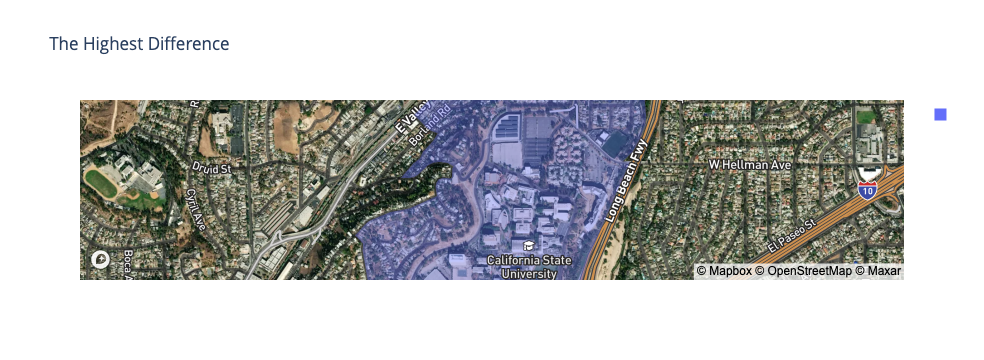

In [47]:
px.choropleth_mapbox(comgdfhigh, 
                     geojson=comgdfhigh.geometry, 
                     locations=comgdfhigh.index, 
                     mapbox_style="satellite-streets",
                     zoom=14, 
                     center = {"lat": center_lat_comgdfhigh, "lon": center_lon_comgdfhigh},
                     hover_data=['community','total_parcels','parcel_count','percent','percent_lag'],
                     opacity=0.4,
                     title='The Highest Difference')

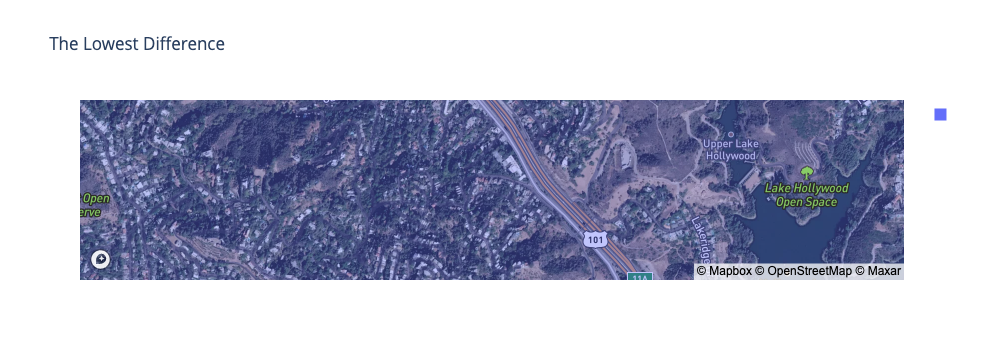

In [48]:
px.choropleth_mapbox(comgdflow, 
                     geojson=comgdflow.geometry, 
                     locations=comgdflow.index, 
                     mapbox_style="satellite-streets",
                     zoom=14, 
                     center = {"lat": center_lat_comgdflow, "lon": center_lon_comgdflow},
                     hover_data=['community','total_parcels','parcel_count','percent','percent_lag'],
                     opacity=0.4,
                     title='The Lowest Difference')

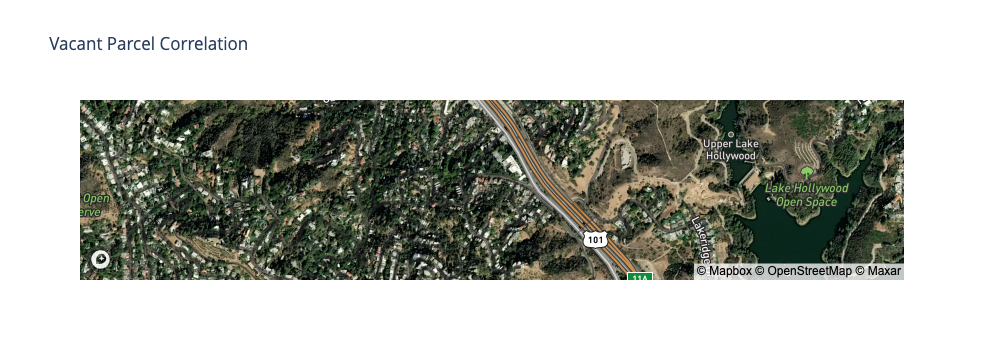

In [50]:
px.choropleth_mapbox(comgdf, 
                     geojson=comgdfhigh.geometry, 
                     locations=comgdf.index, 
                     mapbox_style="satellite-streets",
                     zoom=14, 
                     hover_data=['community','total_parcels','parcel_count','percent','percent_lag'],
                     center = {"lat": 34.1245514405715, "lon": -118.3459018416715},
                     opacity=0.4,
                     title='Vacant Parcel Correlation')

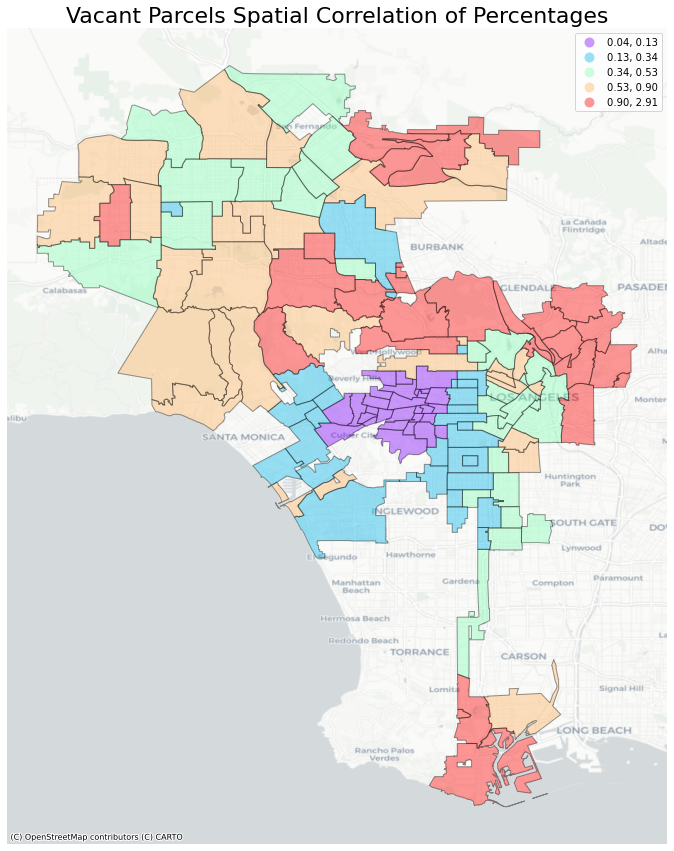

In [61]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
comgdf.plot(ax=ax,
         figsize=(15,15),
         column='percent_lag',
         legend=True,
         alpha=0.4,
        edgecolor='k',
         cmap='rainbow',
         scheme='quantiles')

ax.axis('off')
ax.set_title('Vacant Parcels Spatial Correlation of Percentages',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron, crs=comgdf.crs)

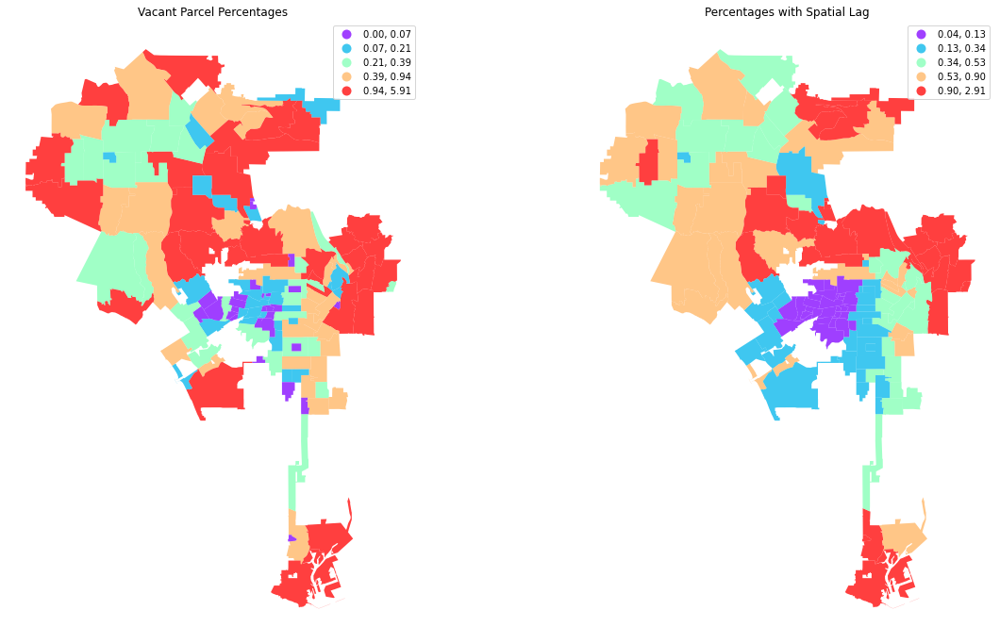

In [64]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
comgdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='percent', 
         cmap='rainbow', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
            legend=True
           )


ax[0].axis("off")
ax[0].set_title("Vacant Parcel Percentages")

# spatial lag map on the right
comgdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='percent_lag', 
         cmap='rainbow', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
            legend=True
           )

ax[1].axis("off")
ax[1].set_title("Percentages with Spatial Lag")

plt.show()

In [65]:
# interactive version needs to be in WGS84
comgdf_web = comgdf.to_crs('EPSG:4326')

In [90]:
vacgdf_web = vacgdf.to_crs('EPSG:4326')

In [66]:
minx, miny, maxx, maxy = comgdf_web.geometry.total_bounds
center_lat_comgdf_web = (maxy-miny)/2+miny
center_lon_comgdf_web = (maxx-minx)/2+minx

In [73]:
median = comgdf_web.percent_lag.describe()
comgdf_web.percent_lag.describe()

count    139.000000
mean       0.595153
std        0.566286
min        0.039829
25%        0.191330
50%        0.425011
75%        0.781203
max        2.913566
Name: percent_lag, dtype: float64

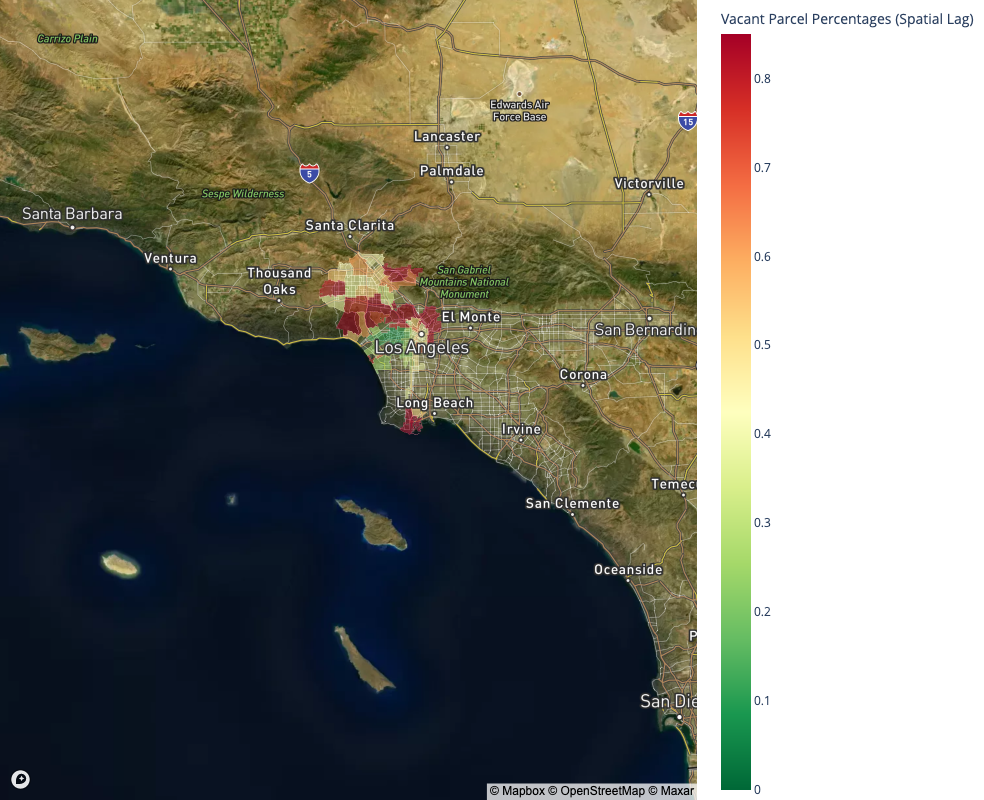

In [80]:
fig = px.choropleth_mapbox(comgdf_web, 
                     geojson=comgdf_web.geometry, # the geometry column
                     locations=comgdf_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='percent_lag',
                     color_continuous_scale='RdYlGn_r',
                           color_continuous_midpoint = 0.425, # put the median as the midpoint
                     range_color =(0,0.425*2),
                     hover_data=['community','total_parcels','parcel_count','percent','percent_lag'],
                     center = {"lat": center_lat_comgdf_web, "lon": center_lon_comgdf_web},
                     opacity=0.5,
                     width=1000,
                     height=800,
                     labels={
                             'percent_lag':'Vacant Parcel Percentages (Spatial Lag)',
                             'percent':'Vacant Parcel Percentages',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [81]:
y = comgdf.percent
moran = Moran(y, wq)
moran.I

0.1902944385199437

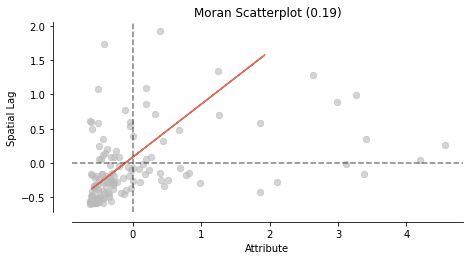

In [82]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

(<Figure size 504x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Reference Distribution'}, xlabel='Moran I: 0.19', ylabel='Density'>)

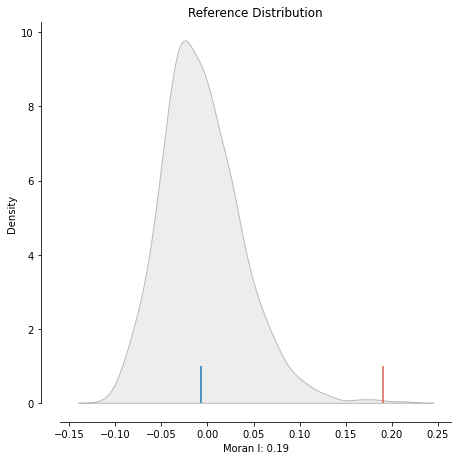

In [83]:
plot_moran_simulation(moran,aspect_equal=False)

In [84]:
moran.p_sim

0.002

In [85]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

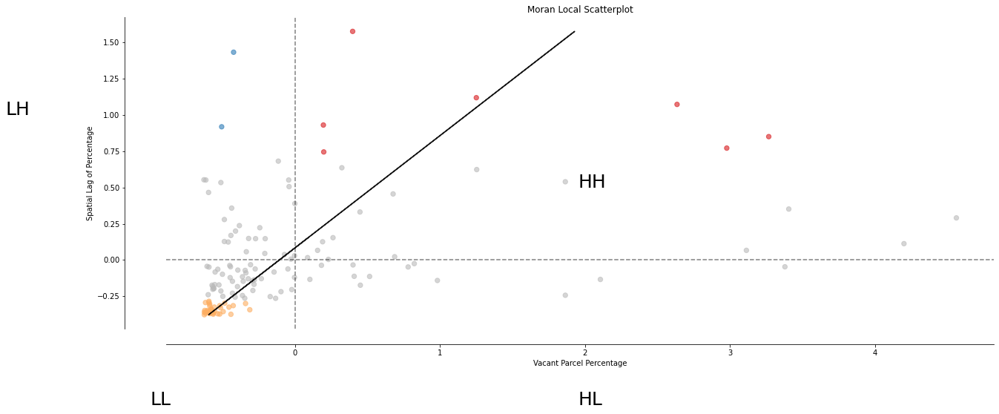

In [86]:
# Plot
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Vacant Parcel Percentage")
ax.set_ylabel('Spatial Lag of Percentage')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

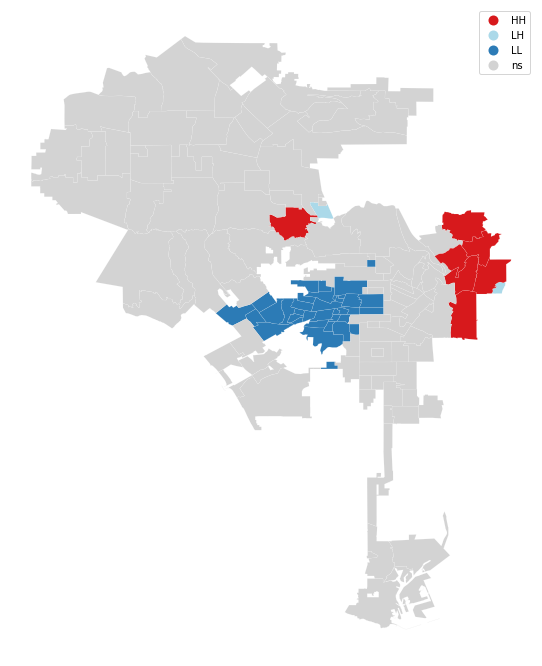

In [88]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, comgdf, p=0.05, ax=ax)
plt.show()

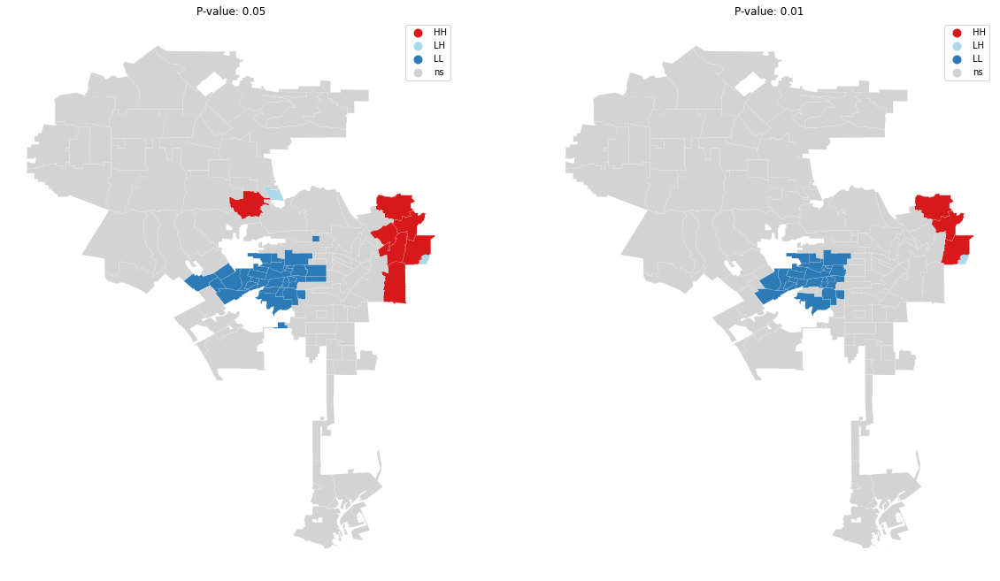

In [89]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# regular count map on the left
lisa_cluster(lisa, comgdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, comgdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()

In [ ]:
fig = px.choropleth_mapbox(vacgdf_web, 
                     geojson=vacgdf_web.geometry, # the geometry column
                     locations=vac_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='percent_lag',
                     color_continuous_scale='RdYlGn_r',
                           color_continuous_midpoint = 0.425, # put the median as the midpoint
                     range_color =(0,0.425*2),
                     hover_data=['community','total_parcels','parcel_count','percent','percent_lag'],
                     center = {"lat": center_lat_comgdf_web, "lon": center_lon_comgdf_web},
                     opacity=0.5,
                     width=1000,
                     height=800,
                     labels={
                             'percent_lag':'Vacant Parcel Percentages (Spatial Lag)',
                             'percent':'Vacant Parcel Percentages',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})